__Data Sourcing and Data Description__

In [10]:
# import the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn import metrics
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression, Ridge, Lasso
from sklearn.metrics import classification_report,confusion_matrix
warnings.filterwarnings('ignore')
%matplotlib inline

In [11]:
# reading the data files
df_assignment = pd.read_csv("Assignment_Data.csv")
df_delivery_partners = pd.read_csv("Delivery_Partners_Data.csv")

In [12]:
# df_assignment
df_assignment.head(5)

,ORDER_ID,DE_ID,ASSIGNMENT_START_TIME,ASSIGNMENT_END_TIME,reject_ind,reject_type,PLACED_TIME,DELIVERED_TIME,LASTMILE_DISTANCE,FIRSTMILE_DISTANCE,LAST_MILE_TIME_PREDICTED,PAYOUT_MADE_TO_DE,NUM_PING_COUNT_LAST10MIN,LAST_PING_TIME_LAST10MIN,CUSTOMER_ZONE,CUSTOMER_LAT,CUSTOMER_LNG
0,2745,180976,2021-02-13 03:08:24.000,2021-02-13 03:38:26.000,0,NaN,2021-02-13 03:01:11.686,2021-02-13 03:43:26.000,320.9,320.0,314.0,1810.0,63,2021-02-13 03:07:34.000,373.0,37.377569,72.832560
1,9462,280243,2021-02-14 05:06:40.000,2021-02-14 05:31:04.000,0,NaN,2021-02-14 04:54:25.832,2021-02-14 05:36:04.000,516.8,342.5,451.0,3210.0,27,2021-02-14 05:06:40.000,373.0,37.380613,72.796909
2,14071,339813,2021-02-15 02:22:40.000,2021-02-15 02:44:02.000,0,NaN,2021-02-15 02:01:17.864,2021-02-15 02:49:02.000,459.5,418.7,443.0,2910.0,57,2021-02-15 02:22:35.000,373.0,37.372032,72.805871
3,14442,1315348,2021-02-15 03:01:25.000,2021-02-15 03:15:02.000,0,NaN,2021-02-15 02:43:41.129,2021-02-15 03:20:02.000,376.4,332.9,367.3,3210.0,41,2021-02-15 03:00:28.000,373.0,37.371380,72.819992
4,14515,1186729,2021-02-15 03:12:24.000,2021-02-15 03:50:24.000,0,NaN,2021-02-15 02:48:17.074,2021-02-15 03:55:24.000,414.5,334.1,413.2,3210.0,13,2021-02-15 03:12:09.000,373.0,37.369925,72.826764


In [13]:
# info of df_assignment
df_assignment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 132394 entries, 0 to 132393
Data columns (total 17 columns):
ORDER_ID                    132394 non-null int64
DE_ID                       132394 non-null int64
ASSIGNMENT_START_TIME       132394 non-null object
ASSIGNMENT_END_TIME         132394 non-null object
reject_ind                  132394 non-null int64
reject_type                 8048 non-null object
PLACED_TIME                 132394 non-null object
DELIVERED_TIME              131782 non-null object
LASTMILE_DISTANCE           132384 non-null float64
FIRSTMILE_DISTANCE          132238 non-null float64
LAST_MILE_TIME_PREDICTED    132394 non-null float64
PAYOUT_MADE_TO_DE           132391 non-null float64
NUM_PING_COUNT_LAST10MIN    132394 non-null int64
LAST_PING_TIME_LAST10MIN    132394 non-null object
CUSTOMER_ZONE               113853 non-null float64
CUSTOMER_LAT                132394 non-null float64
CUSTOMER_LNG                132394 non-null float64
dtypes: float64(7), i

__Note__ : From the info of df_assignment:
            1. reject_type                 8048 non-null object
            2. DELIVERED_TIME              131782 non-null object
            3. LASTMILE_DISTANCE           132384 non-null float64
            4. FIRSTMILE_DISTANCE          132238 non-null float64
            5. PAYOUT_MADE_TO_DE           132391 non-null float64
            6. CUSTOMER_ZONE               113853 non-null float64



In [14]:
# shape of df_assignment - 132394 rows 17 columns
df_assignment.shape

(132394, 17)

In [15]:
# length of unique DE_ID in df_assignment
len(df_assignment.DE_ID.unique())

991

In [16]:
# df_delivery_partners
df_delivery_partners.head(5)

,DE_ID,SHIFT_END_TIME,DE_HOME_LAT,DE_HOME_LNG,DE_JOINING_DATE,DE_ZONE_ID
0,141533,06:42,37.390427,72.849424,2019-09-20,372
1,235942,08:42,37.372289,72.885341,2020-03-15,372
2,973234,06:42,37.410268,72.853610,2018-12-21,375
3,973473,05:42,37.397067,72.872533,2018-12-21,624
4,1016546,06:42,37.425545,72.895137,2019-01-11,668


In [17]:
# length of delivery partners having unique DE_ID
len(df_delivery_partners.DE_ID.unique())

991

__Note__ : The unique count of DE_ID of df_assignment and df_delivery_partners is same.

In [18]:
# info of df_delivery_partners
df_delivery_partners.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 991 entries, 0 to 990
Data columns (total 6 columns):
DE_ID              991 non-null int64
SHIFT_END_TIME     991 non-null object
DE_HOME_LAT        991 non-null float64
DE_HOME_LNG        991 non-null float64
DE_JOINING_DATE    991 non-null object
DE_ZONE_ID         991 non-null int64
dtypes: float64(2), int64(2), object(2)
memory usage: 46.6+ KB


In [19]:
# shape of df_delivery_partners - 991 rows 6 columns
df_delivery_partners.shape 

(991, 6)

__Data Cleaning and Manipulation and Univariate Analysis__

In [20]:
# missing values of df_assignment
df_assignment.isnull().sum()

ORDER_ID                         0
DE_ID                            0
ASSIGNMENT_START_TIME            0
ASSIGNMENT_END_TIME              0
reject_ind                       0
reject_type                 124346
PLACED_TIME                      0
DELIVERED_TIME                 612
LASTMILE_DISTANCE               10
FIRSTMILE_DISTANCE             156
LAST_MILE_TIME_PREDICTED         0
PAYOUT_MADE_TO_DE                3
NUM_PING_COUNT_LAST10MIN         0
LAST_PING_TIME_LAST10MIN         0
CUSTOMER_ZONE                18541
CUSTOMER_LAT                     0
CUSTOMER_LNG                     0
dtype: int64

In [21]:
# missing values of df_delivery_partners
df_delivery_partners.isnull().sum()

DE_ID              0
SHIFT_END_TIME     0
DE_HOME_LAT        0
DE_HOME_LNG        0
DE_JOINING_DATE    0
DE_ZONE_ID         0
dtype: int64

In [22]:
# merge two dfs
df_master = pd.merge(df_assignment, df_delivery_partners, how="inner",on="DE_ID")

In [23]:
# shape of df_master
df_master.shape

(132394, 22)

In [24]:
# info of df_master
df_master.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 132394 entries, 0 to 132393
Data columns (total 22 columns):
ORDER_ID                    132394 non-null int64
DE_ID                       132394 non-null int64
ASSIGNMENT_START_TIME       132394 non-null object
ASSIGNMENT_END_TIME         132394 non-null object
reject_ind                  132394 non-null int64
reject_type                 8048 non-null object
PLACED_TIME                 132394 non-null object
DELIVERED_TIME              131782 non-null object
LASTMILE_DISTANCE           132384 non-null float64
FIRSTMILE_DISTANCE          132238 non-null float64
LAST_MILE_TIME_PREDICTED    132394 non-null float64
PAYOUT_MADE_TO_DE           132391 non-null float64
NUM_PING_COUNT_LAST10MIN    132394 non-null int64
LAST_PING_TIME_LAST10MIN    132394 non-null object
CUSTOMER_ZONE               113853 non-null float64
CUSTOMER_LAT                132394 non-null float64
CUSTOMER_LNG                132394 non-null float64
SHIFT_END_TIME       

In [25]:
# columns of df_master
df_master.columns

Index(['ORDER_ID', 'DE_ID', 'ASSIGNMENT_START_TIME', 'ASSIGNMENT_END_TIME',
       'reject_ind', 'reject_type', 'PLACED_TIME', 'DELIVERED_TIME',
       'LASTMILE_DISTANCE', 'FIRSTMILE_DISTANCE', 'LAST_MILE_TIME_PREDICTED',
       'PAYOUT_MADE_TO_DE', 'NUM_PING_COUNT_LAST10MIN',
       'LAST_PING_TIME_LAST10MIN', 'CUSTOMER_ZONE', 'CUSTOMER_LAT',
       'CUSTOMER_LNG', 'SHIFT_END_TIME', 'DE_HOME_LAT', 'DE_HOME_LNG',
       'DE_JOINING_DATE', 'DE_ZONE_ID'],
      dtype='object')

In [26]:
# checking missing values in df_master
df_master.isnull().sum()

ORDER_ID                         0
DE_ID                            0
ASSIGNMENT_START_TIME            0
ASSIGNMENT_END_TIME              0
reject_ind                       0
reject_type                 124346
PLACED_TIME                      0
DELIVERED_TIME                 612
LASTMILE_DISTANCE               10
FIRSTMILE_DISTANCE             156
LAST_MILE_TIME_PREDICTED         0
PAYOUT_MADE_TO_DE                3
NUM_PING_COUNT_LAST10MIN         0
LAST_PING_TIME_LAST10MIN         0
CUSTOMER_ZONE                18541
CUSTOMER_LAT                     0
CUSTOMER_LNG                     0
SHIFT_END_TIME                   0
DE_HOME_LAT                      0
DE_HOME_LNG                      0
DE_JOINING_DATE                  0
DE_ZONE_ID                       0
dtype: int64

In [27]:
# percentage of missing values
round(100*(df_master.isnull().sum()/len(df_master.index)), 2)

ORDER_ID                     0.00
DE_ID                        0.00
ASSIGNMENT_START_TIME        0.00
ASSIGNMENT_END_TIME          0.00
reject_ind                   0.00
reject_type                 93.92
PLACED_TIME                  0.00
DELIVERED_TIME               0.46
LASTMILE_DISTANCE            0.01
FIRSTMILE_DISTANCE           0.12
LAST_MILE_TIME_PREDICTED     0.00
PAYOUT_MADE_TO_DE            0.00
NUM_PING_COUNT_LAST10MIN     0.00
LAST_PING_TIME_LAST10MIN     0.00
CUSTOMER_ZONE               14.00
CUSTOMER_LAT                 0.00
CUSTOMER_LNG                 0.00
SHIFT_END_TIME               0.00
DE_HOME_LAT                  0.00
DE_HOME_LNG                  0.00
DE_JOINING_DATE              0.00
DE_ZONE_ID                   0.00
dtype: float64

In [28]:
# count of reject_ind
df_master.reject_ind.value_counts()


0    124346
1      8048
Name: reject_ind, dtype: int64

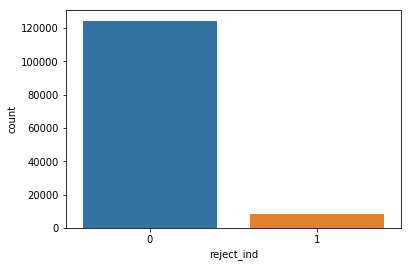

In [29]:
# count of plot for reject_ind
sns.countplot(df_master.reject_ind)
plt.show()

In [30]:
# checking reject_type 
df_master.reject_type.value_counts()


Type-1    3853
Type-2    2007
Type-3    1449
Type-4     739
Name: reject_type, dtype: int64

__Note__ : reject_type has not null 8048 rows but 124346 is null. Here for 124346 rows, reject_ind is 0.
That means, for the order that are accepted, there is no type mentioned and so we have NaN in those rows. Let us replace it with the common type 'Type-0'

In [31]:
# replace NaN with Type-0 in reject_type
df_master.reject_type = df_master.reject_type.replace(np.nan, "Type-0")
df_master.reject_type = df_master.reject_type.astype('category')


In [32]:
# missing percentage of df_master
round(100*(df_master.isnull().sum()/len(df_master.index)), 2)

ORDER_ID                     0.00
DE_ID                        0.00
ASSIGNMENT_START_TIME        0.00
ASSIGNMENT_END_TIME          0.00
reject_ind                   0.00
reject_type                  0.00
PLACED_TIME                  0.00
DELIVERED_TIME               0.46
LASTMILE_DISTANCE            0.01
FIRSTMILE_DISTANCE           0.12
LAST_MILE_TIME_PREDICTED     0.00
PAYOUT_MADE_TO_DE            0.00
NUM_PING_COUNT_LAST10MIN     0.00
LAST_PING_TIME_LAST10MIN     0.00
CUSTOMER_ZONE               14.00
CUSTOMER_LAT                 0.00
CUSTOMER_LNG                 0.00
SHIFT_END_TIME               0.00
DE_HOME_LAT                  0.00
DE_HOME_LNG                  0.00
DE_JOINING_DATE              0.00
DE_ZONE_ID                   0.00
dtype: float64

In [33]:
# exploring CUSTOMER_ZONE
df_master.CUSTOMER_ZONE.unique()


array([373., 375., 668.,  nan, 841., 372., 624., 374., 382.])

In [34]:
# count of reject_ind where customer zone is null
df_master[pd.isnull(df_master.CUSTOMER_ZONE)].reject_ind.value_counts()


0    16979
1     1562
Name: reject_ind, dtype: int64

In [35]:
# impute NaN with mode of customer zone
df_master.CUSTOMER_ZONE = df_master.CUSTOMER_ZONE.fillna(df_master.CUSTOMER_ZONE.mode()[0])
df_master.CUSTOMER_ZONE.value_counts()

375.0    45486
372.0    20808
624.0    17636
373.0    14621
841.0    14518
374.0    12380
668.0     6935
382.0       10
Name: CUSTOMER_ZONE, dtype: int64

__Note__ : customer zone seems to be category so lets impute it with mode.

In [36]:
# Customer zone seems to have some int categories . Lets convert it into category
df_master.CUSTOMER_ZONE = df_master.CUSTOMER_ZONE.astype('int').astype('category')
df_master.CUSTOMER_ZONE.value_counts()

375    45486
372    20808
624    17636
373    14621
841    14518
374    12380
668     6935
382       10
Name: CUSTOMER_ZONE, dtype: int64

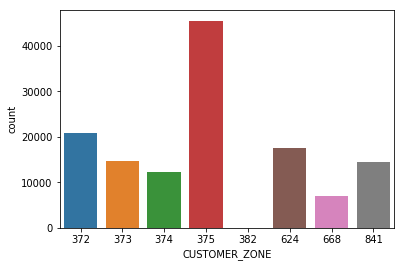

In [37]:
# count of customer_zone
sns.countplot(df_master.CUSTOMER_ZONE)
plt.show()

In [38]:
# missing percentage of df_master
round(100*(df_master.isnull().sum()/len(df_master.index)), 2)

ORDER_ID                    0.00
DE_ID                       0.00
ASSIGNMENT_START_TIME       0.00
ASSIGNMENT_END_TIME         0.00
reject_ind                  0.00
reject_type                 0.00
PLACED_TIME                 0.00
DELIVERED_TIME              0.46
LASTMILE_DISTANCE           0.01
FIRSTMILE_DISTANCE          0.12
LAST_MILE_TIME_PREDICTED    0.00
PAYOUT_MADE_TO_DE           0.00
NUM_PING_COUNT_LAST10MIN    0.00
LAST_PING_TIME_LAST10MIN    0.00
CUSTOMER_ZONE               0.00
CUSTOMER_LAT                0.00
CUSTOMER_LNG                0.00
SHIFT_END_TIME              0.00
DE_HOME_LAT                 0.00
DE_HOME_LNG                 0.00
DE_JOINING_DATE             0.00
DE_ZONE_ID                  0.00
dtype: float64

In [39]:
# checking for delivered_time in df_master
df_master[pd.isnull(df_master.DELIVERED_TIME)]

,ORDER_ID,DE_ID,ASSIGNMENT_START_TIME,ASSIGNMENT_END_TIME,reject_ind,reject_type,PLACED_TIME,DELIVERED_TIME,LASTMILE_DISTANCE,FIRSTMILE_DISTANCE,...,NUM_PING_COUNT_LAST10MIN,LAST_PING_TIME_LAST10MIN,CUSTOMER_ZONE,CUSTOMER_LAT,CUSTOMER_LNG,SHIFT_END_TIME,DE_HOME_LAT,DE_HOME_LNG,DE_JOINING_DATE,DE_ZONE_ID
318,74371,280243,2021-02-25 06:32:32.000,2021-02-25 06:41:47.000,1,Type-1,2021-02-25 06:19:03.172,NaN,684.5,396.5,...,43,2021-02-25 06:32:16.000,668,37.398099,72.942389,06:42,37.377694,72.850738,2020-05-19,372
834,16686,1315348,2021-02-15 06:10:40.000,2021-02-15 06:13:40.000,1,Type-2,2021-02-15 05:40:01.568,NaN,389.9,354.2,...,10,2021-02-15 06:06:48.000,375,37.404832,72.839440,06:42,37.422797,72.824708,2019-06-02,372
872,16527,1315348,2021-02-15 05:46:40.000,2021-02-15 06:04:55.000,1,Type-1,2021-02-15 05:24:45.587,NaN,370.1,345.8,...,22,2021-02-15 05:46:30.000,375,37.436294,72.839579,06:42,37.422797,72.824708,2019-06-02,372
873,16527,1315348,2021-02-15 05:46:40.000,2021-02-15 06:04:55.799,1,Type-3,2021-02-15 05:24:45.587,NaN,370.1,345.8,...,22,2021-02-15 05:46:30.000,375,37.436294,72.839579,06:42,37.422797,72.824708,2019-06-02,372
997,51622,1186729,2021-02-21 18:14:02.000,2021-02-21 18:17:02.000,1,Type-2,2021-02-21 18:05:20.182,NaN,470.6,389.3,...,28,2021-02-21 18:13:57.000,373,37.366072,72.825184,05:42,37.386463,72.854589,2019-04-05,372
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131795,4319,324811,2021-02-13 05:45:25.000,2021-02-13 05:47:17.484,1,Type-3,2021-02-13 05:11:42.666,NaN,529.1,421.7,...,9,2021-02-13 05:44:09.000,841,37.358939,72.896025,06:42,37.398369,72.926424,2020-07-06,668
131826,107522,401310,2021-03-03 03:03:20.000,2021-03-03 03:06:20.000,1,Type-2,2021-03-03 03:02:04.655,NaN,357.5,326.6,...,8,2021-03-03 03:01:15.000,374,37.358473,72.854558,05:42,37.362718,72.864295,2020-09-22,841
132109,52813,288608,2021-02-21 23:00:02.000,2021-02-21 23:37:51.000,1,Type-2,2021-02-21 22:59:13.934,NaN,402.5,342.8,...,7,2021-02-21 22:58:17.000,668,37.396972,72.914471,06:42,37.365884,72.822460,2020-05-28,668
132110,28389,288608,2021-02-17 22:12:40.000,2021-02-17 23:00:43.000,1,Type-2,2021-02-17 22:09:27.141,NaN,506.3,386.6,...,17,2021-02-17 22:12:26.000,668,37.396984,72.922641,06:42,37.365884,72.822460,2020-05-28,668


In [40]:
# DELIVERED_TIME column have null values in the rows where reject_ind is 1.
df_master[pd.isnull(df_master.DELIVERED_TIME)].reject_ind.value_counts()

1    612
Name: reject_ind, dtype: int64

In [41]:
# count of delivered time
df_master.DELIVERED_TIME.value_counts()

2021-02-14 07:35:48.000    13
2021-02-13 05:49:14.000     8
2021-02-23 03:00:11.000     8
2021-02-16 04:51:11.000     7
2021-02-24 03:50:06.000     7
                           ..
2021-02-26 06:11:38.000     1
2021-02-19 04:31:43.000     1
2021-02-16 20:24:43.000     1
2021-03-05 05:05:03.000     1
2021-03-02 19:31:52.000     1
Name: DELIVERED_TIME, Length: 115664, dtype: int64

__Note__ : NaN values of DELIVERED_TIME column have reject orders. So we cannot remove it. We can impute it with mode metric.

In [42]:
# frequency of delivered time
df_master.DELIVERED_TIME = df_master.DELIVERED_TIME. fillna(df_master.DELIVERED_TIME. mode()[0])


In [43]:
# missing percentage of df_master
round(100*(df_master.isnull().sum()/len(df_master.index)), 2)

ORDER_ID                    0.00
DE_ID                       0.00
ASSIGNMENT_START_TIME       0.00
ASSIGNMENT_END_TIME         0.00
reject_ind                  0.00
reject_type                 0.00
PLACED_TIME                 0.00
DELIVERED_TIME              0.00
LASTMILE_DISTANCE           0.01
FIRSTMILE_DISTANCE          0.12
LAST_MILE_TIME_PREDICTED    0.00
PAYOUT_MADE_TO_DE           0.00
NUM_PING_COUNT_LAST10MIN    0.00
LAST_PING_TIME_LAST10MIN    0.00
CUSTOMER_ZONE               0.00
CUSTOMER_LAT                0.00
CUSTOMER_LNG                0.00
SHIFT_END_TIME              0.00
DE_HOME_LAT                 0.00
DE_HOME_LNG                 0.00
DE_JOINING_DATE             0.00
DE_ZONE_ID                  0.00
dtype: float64

In [44]:
# checking for null for last mile distance
df_master[pd.isnull(df_master.LASTMILE_DISTANCE)]


,ORDER_ID,DE_ID,ASSIGNMENT_START_TIME,ASSIGNMENT_END_TIME,reject_ind,reject_type,PLACED_TIME,DELIVERED_TIME,LASTMILE_DISTANCE,FIRSTMILE_DISTANCE,...,NUM_PING_COUNT_LAST10MIN,LAST_PING_TIME_LAST10MIN,CUSTOMER_ZONE,CUSTOMER_LAT,CUSTOMER_LNG,SHIFT_END_TIME,DE_HOME_LAT,DE_HOME_LNG,DE_JOINING_DATE,DE_ZONE_ID
976,59837,1186729,2021-02-23 03:05:16.000,2021-02-23 03:08:16.000,1,Type-2,2021-02-23 02:56:29.613,2021-02-23 03:34:06.000,NaN,NaN,...,28,2021-02-23 03:05:05.000,373,37.379549,72.822610,05:42,37.386463,72.854589,2019-04-05,372
977,59837,1186729,2021-02-23 03:05:16.000,2021-02-23 03:08:17.000,1,Type-2,2021-02-23 02:56:29.613,2021-02-23 03:34:06.000,NaN,NaN,...,28,2021-02-23 03:05:05.000,373,37.379549,72.822610,05:42,37.386463,72.854589,2019-04-05,372
19593,66243,1148785,2021-02-24 04:00:33.000,2021-02-24 04:41:53.183,1,Type-3,2021-02-24 03:54:47.217,2021-02-24 05:00:42.000,NaN,NaN,...,4,2021-02-24 04:00:23.000,372,37.387410,72.864725,08:42,37.388699,72.849173,2019-03-16,372
20628,124781,735519,2021-03-05 07:33:20.000,2021-03-05 08:25:03.000,0,Type-0,2021-03-05 07:31:38.922,2021-03-05 08:30:03.000,NaN,NaN,...,45,2021-03-05 07:33:08.000,372,37.382654,72.868775,05:42,37.381014,72.872632,2018-08-04,372
22702,52982,1268868,2021-02-21 23:28:02.000,2021-02-22 00:33:31.779,1,Type-3,2021-02-21 23:27:44.874,2021-02-14 07:35:48.000,NaN,NaN,...,9,2021-02-21 23:27:49.000,841,37.381814,72.875002,05:42,37.354442,72.907380,2019-05-12,841
44499,83467,902088,2021-02-26 22:54:16.000,2021-02-26 22:57:16.000,1,Type-2,2021-02-26 22:45:13.165,2021-02-26 23:22:00.000,NaN,NaN,...,13,2021-02-26 22:53:57.000,375,37.356698,72.821878,05:42,37.383926,72.849691,2018-11-16,372
44500,83467,902088,2021-02-26 22:54:16.000,2021-02-26 22:57:17.000,1,Type-2,2021-02-26 22:45:13.165,2021-02-26 23:22:00.000,NaN,NaN,...,13,2021-02-26 22:53:57.000,375,37.356698,72.821878,05:42,37.383926,72.849691,2018-11-16,372
60813,88779,1180464,2021-02-27 21:50:32.000,2021-02-27 22:18:21.472,1,Type-3,2021-02-27 21:49:08.636,2021-02-14 07:35:48.000,NaN,NaN,...,26,2021-02-27 21:50:30.000,373,37.379030,72.826540,05:42,37.391574,72.871708,2019-04-01,372
83074,83467,21914,2021-02-26 22:57:17.000,2021-02-26 23:17:00.000,0,Type-0,2021-02-26 22:45:13.165,2021-02-26 23:22:00.000,NaN,NaN,...,20,2021-02-26 22:56:47.000,375,37.356698,72.821878,05:42,37.382695,72.847089,2019-07-07,372
86986,59837,882145,2021-02-23 03:08:17.000,2021-02-23 03:29:06.000,0,Type-0,2021-02-23 02:56:29.613,2021-02-23 03:34:06.000,NaN,NaN,...,11,2021-02-23 03:08:12.000,373,37.379549,72.822610,05:42,37.423306,72.813321,2018-11-04,375


In [45]:
# description of last mile distance
df_master.LASTMILE_DISTANCE.describe()

count    132384.000000
mean        432.864177
std          82.305359
min         320.000000
25%         373.400000
50%         415.400000
75%         473.900000
max        1044.500000
Name: LASTMILE_DISTANCE, dtype: float64

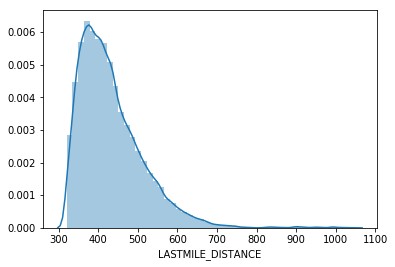

In [46]:
# checking which metric for imputation of Last mile distance
sns.distplot(df_master.LASTMILE_DISTANCE[~pd.isnull(df_master.LASTMILE_DISTANCE)])
plt.show()

__Note__ : Imputing last mile with median in place of NaNs as distribution is skewed

In [47]:
# Impute with last mile distance with median
df_master['LASTMILE_DISTANCE'] = df_master['LASTMILE_DISTANCE'].fillna(df_master['LASTMILE_DISTANCE'].median())
df_master['LASTMILE_DISTANCE'] 

0         320.9
1         370.4
2         408.2
3         389.6
4         392.3
          ...  
132389    452.6
132390    350.6
132391    497.3
132392    548.6
132393    548.6
Name: LASTMILE_DISTANCE, Length: 132394, dtype: float64

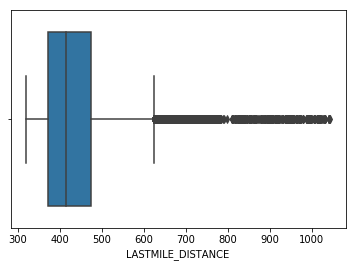

In [48]:
# box plot of last mile distance
sns.boxplot(df_master.LASTMILE_DISTANCE)
plt.show()

In [49]:
# missing value percentage of df_master
round(100*(df_master.isnull().sum()/len(df_master.index)), 2)

ORDER_ID                    0.00
DE_ID                       0.00
ASSIGNMENT_START_TIME       0.00
ASSIGNMENT_END_TIME         0.00
reject_ind                  0.00
reject_type                 0.00
PLACED_TIME                 0.00
DELIVERED_TIME              0.00
LASTMILE_DISTANCE           0.00
FIRSTMILE_DISTANCE          0.12
LAST_MILE_TIME_PREDICTED    0.00
PAYOUT_MADE_TO_DE           0.00
NUM_PING_COUNT_LAST10MIN    0.00
LAST_PING_TIME_LAST10MIN    0.00
CUSTOMER_ZONE               0.00
CUSTOMER_LAT                0.00
CUSTOMER_LNG                0.00
SHIFT_END_TIME              0.00
DE_HOME_LAT                 0.00
DE_HOME_LNG                 0.00
DE_JOINING_DATE             0.00
DE_ZONE_ID                  0.00
dtype: float64

In [50]:
# description of first mile distance
df_master.FIRSTMILE_DISTANCE.describe()

count    132238.000000
mean        364.857121
std          40.211260
min         320.000000
25%         327.500000
50%         356.600000
75%         392.600000
max         743.000000
Name: FIRSTMILE_DISTANCE, dtype: float64

In [51]:
# checking for null for firstmile distance
df_master[pd.isnull(df_master.FIRSTMILE_DISTANCE)]


,ORDER_ID,DE_ID,ASSIGNMENT_START_TIME,ASSIGNMENT_END_TIME,reject_ind,reject_type,PLACED_TIME,DELIVERED_TIME,LASTMILE_DISTANCE,FIRSTMILE_DISTANCE,...,NUM_PING_COUNT_LAST10MIN,LAST_PING_TIME_LAST10MIN,CUSTOMER_ZONE,CUSTOMER_LAT,CUSTOMER_LNG,SHIFT_END_TIME,DE_HOME_LAT,DE_HOME_LNG,DE_JOINING_DATE,DE_ZONE_ID
952,16566,1186729,2021-02-15 05:55:07.000,2021-02-15 06:06:00.000,0,Type-0,2021-02-15 05:27:54.305,2021-02-15 06:11:00.000,346.7,NaN,...,47,2021-02-15 05:54:23.000,373,37.364056,72.804320,05:42,37.386463,72.854589,2019-04-05,372
976,59837,1186729,2021-02-23 03:05:16.000,2021-02-23 03:08:16.000,1,Type-2,2021-02-23 02:56:29.613,2021-02-23 03:34:06.000,415.4,NaN,...,28,2021-02-23 03:05:05.000,373,37.379549,72.822610,05:42,37.386463,72.854589,2019-04-05,372
977,59837,1186729,2021-02-23 03:05:16.000,2021-02-23 03:08:17.000,1,Type-2,2021-02-23 02:56:29.613,2021-02-23 03:34:06.000,415.4,NaN,...,28,2021-02-23 03:05:05.000,373,37.379549,72.822610,05:42,37.386463,72.854589,2019-04-05,372
1410,59711,1186729,2021-02-23 03:11:15.000,2021-02-23 03:28:06.000,0,Type-0,2021-02-23 02:43:25.884,2021-02-23 03:33:06.000,439.1,NaN,...,20,2021-02-23 03:10:51.000,374,37.363302,72.834140,05:42,37.386463,72.854589,2019-04-05,372
1838,16827,381057,2021-02-15 06:37:46.000,2021-02-15 07:10:56.000,0,Type-0,2021-02-15 05:56:19.632,2021-02-15 07:15:56.000,449.9,NaN,...,7,2021-02-15 06:37:24.000,373,37.382300,72.806097,06:42,37.361051,72.840651,2020-08-31,373
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131387,53216,1246682,2021-02-22 00:23:09.000,2021-02-22 00:35:33.000,0,Type-0,2021-02-22 00:15:18.908,2021-02-22 00:40:33.000,349.4,NaN,...,21,2021-02-22 00:22:03.000,668,37.411858,72.904606,06:42,37.409772,72.898424,2041-03-02,668
131941,39461,1017935,2021-02-19 04:57:59.000,2021-02-19 05:18:40.000,0,Type-0,2021-02-19 04:24:33.519,2021-02-19 05:23:40.000,347.3,NaN,...,4,2021-02-19 04:57:56.000,668,37.395205,72.908853,06:42,37.434555,72.886820,2019-01-11,668
131962,44693,1017935,2021-02-20 04:21:34.000,2021-02-20 04:24:34.000,1,Type-2,2021-02-20 04:12:00.966,2021-02-20 04:51:42.000,443.6,NaN,...,8,2021-02-20 04:19:53.000,624,37.403775,72.877728,06:42,37.434555,72.886820,2019-01-11,668
132188,124013,397978,2021-03-05 06:19:07.000,2021-03-05 06:39:06.000,0,Type-0,2021-03-05 05:20:36.283,2021-03-05 06:44:06.000,320.3,NaN,...,9,2021-03-05 06:19:02.000,668,37.393924,72.925990,06:42,37.393181,72.929087,2020-09-18,668


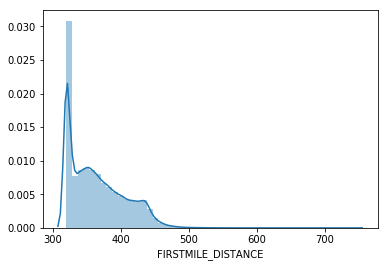

In [52]:
# checking which metric for imputation of Last mile distance
sns.distplot(df_master.FIRSTMILE_DISTANCE[~pd.isnull(df_master.FIRSTMILE_DISTANCE)])
plt.show()

__Note__ : First mile distance - imputing NaNs with median as again skewed distribution

In [53]:
# first mile distance for df_master
df_master['FIRSTMILE_DISTANCE'] = df_master['FIRSTMILE_DISTANCE'].fillna(df_master['FIRSTMILE_DISTANCE'].median())
df_master['FIRSTMILE_DISTANCE'] 

0         320.0
1         414.5
2         320.0
3         342.8
4         418.1
          ...  
132389    398.3
132390    440.9
132391    444.8
132392    341.3
132393    341.3
Name: FIRSTMILE_DISTANCE, Length: 132394, dtype: float64

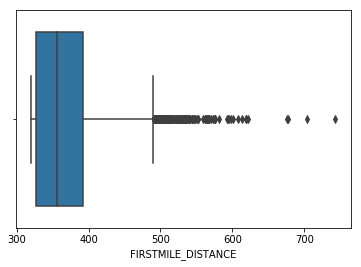

In [54]:
# checking for boxplot for firstmile distance
sns.boxplot(df_master.FIRSTMILE_DISTANCE)
plt.show()

In [55]:
# missing value percentage for df_master
round(100*(df_master.isnull().sum()/len(df_master.index)), 2)

ORDER_ID                    0.0
DE_ID                       0.0
ASSIGNMENT_START_TIME       0.0
ASSIGNMENT_END_TIME         0.0
reject_ind                  0.0
reject_type                 0.0
PLACED_TIME                 0.0
DELIVERED_TIME              0.0
LASTMILE_DISTANCE           0.0
FIRSTMILE_DISTANCE          0.0
LAST_MILE_TIME_PREDICTED    0.0
PAYOUT_MADE_TO_DE           0.0
NUM_PING_COUNT_LAST10MIN    0.0
LAST_PING_TIME_LAST10MIN    0.0
CUSTOMER_ZONE               0.0
CUSTOMER_LAT                0.0
CUSTOMER_LNG                0.0
SHIFT_END_TIME              0.0
DE_HOME_LAT                 0.0
DE_HOME_LNG                 0.0
DE_JOINING_DATE             0.0
DE_ZONE_ID                  0.0
dtype: float64

In [56]:
# sum of missing values for df_master
df_master.isnull().sum()

ORDER_ID                    0
DE_ID                       0
ASSIGNMENT_START_TIME       0
ASSIGNMENT_END_TIME         0
reject_ind                  0
reject_type                 0
PLACED_TIME                 0
DELIVERED_TIME              0
LASTMILE_DISTANCE           0
FIRSTMILE_DISTANCE          0
LAST_MILE_TIME_PREDICTED    0
PAYOUT_MADE_TO_DE           3
NUM_PING_COUNT_LAST10MIN    0
LAST_PING_TIME_LAST10MIN    0
CUSTOMER_ZONE               0
CUSTOMER_LAT                0
CUSTOMER_LNG                0
SHIFT_END_TIME              0
DE_HOME_LAT                 0
DE_HOME_LNG                 0
DE_JOINING_DATE             0
DE_ZONE_ID                  0
dtype: int64

In [57]:
# payout made to de description
df_master.PAYOUT_MADE_TO_DE.describe()

count    132391.000000
mean       2764.807124
std        1277.496520
min           0.000000
25%        2110.000000
50%        2610.000000
75%        3260.000000
max       10410.000000
Name: PAYOUT_MADE_TO_DE, dtype: float64

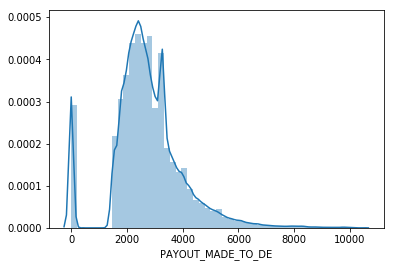

In [58]:
# checking which metric for imputation of Last mile distance
sns.distplot(df_master.PAYOUT_MADE_TO_DE[~pd.isnull(df_master.PAYOUT_MADE_TO_DE)])
plt.show()

__Note__ : As NaN payout made to de are only 3 rows of reject type 0, lets drop it.

In [59]:
# checking for null values for payout made to de
df_master = df_master[~pd.isnull(df_master.PAYOUT_MADE_TO_DE)]

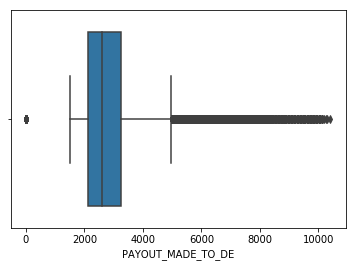

In [60]:
# box plot of payout made to de
sns.boxplot(df_master.PAYOUT_MADE_TO_DE)
plt.show()

In [61]:
# column data type of df_master
df_master.dtypes

ORDER_ID                       int64
DE_ID                          int64
ASSIGNMENT_START_TIME         object
ASSIGNMENT_END_TIME           object
reject_ind                     int64
reject_type                 category
PLACED_TIME                   object
DELIVERED_TIME                object
LASTMILE_DISTANCE            float64
FIRSTMILE_DISTANCE           float64
LAST_MILE_TIME_PREDICTED     float64
PAYOUT_MADE_TO_DE            float64
NUM_PING_COUNT_LAST10MIN       int64
LAST_PING_TIME_LAST10MIN      object
CUSTOMER_ZONE               category
CUSTOMER_LAT                 float64
CUSTOMER_LNG                 float64
SHIFT_END_TIME                object
DE_HOME_LAT                  float64
DE_HOME_LNG                  float64
DE_JOINING_DATE               object
DE_ZONE_ID                     int64
dtype: object

In [62]:
# df_master
df_master.head()

,ORDER_ID,DE_ID,ASSIGNMENT_START_TIME,ASSIGNMENT_END_TIME,reject_ind,reject_type,PLACED_TIME,DELIVERED_TIME,LASTMILE_DISTANCE,FIRSTMILE_DISTANCE,...,NUM_PING_COUNT_LAST10MIN,LAST_PING_TIME_LAST10MIN,CUSTOMER_ZONE,CUSTOMER_LAT,CUSTOMER_LNG,SHIFT_END_TIME,DE_HOME_LAT,DE_HOME_LNG,DE_JOINING_DATE,DE_ZONE_ID
0,2745,180976,2021-02-13 03:08:24.000,2021-02-13 03:38:26.000,0,Type-0,2021-02-13 03:01:11.686,2021-02-13 03:43:26.000,320.9,320.0,...,63,2021-02-13 03:07:34.000,373,37.377569,72.832560,05:42,37.374634,72.871986,2019-10-25,373
1,14974,180976,2021-02-15 03:36:24.000,2021-02-15 03:54:31.000,0,Type-0,2021-02-15 03:30:24.093,2021-02-15 03:59:31.000,370.4,414.5,...,52,2021-02-15 03:36:19.000,373,37.368782,72.809458,05:42,37.374634,72.871986,2019-10-25,373
2,115325,180976,2021-03-04 04:57:21.000,2021-03-04 05:23:19.000,0,Type-0,2021-03-04 04:47:34.977,2021-03-04 05:28:19.000,408.2,320.0,...,9,2021-03-04 04:56:33.000,373,37.374205,72.827956,05:42,37.374634,72.871986,2019-10-25,373
3,1648,180976,2021-02-13 00:12:40.000,2021-02-13 01:02:36.000,0,Type-0,2021-02-13 00:11:09.582,2021-02-13 01:07:36.000,389.6,342.8,...,16,2021-02-13 00:12:27.000,373,37.369154,72.815318,05:42,37.374634,72.871986,2019-10-25,373
4,72496,180976,2021-02-25 04:08:34.000,2021-02-25 04:30:31.000,0,Type-0,2021-02-25 03:56:48.521,2021-02-25 04:35:31.000,392.3,418.1,...,13,2021-02-25 04:07:58.000,373,37.376896,72.834044,05:42,37.374634,72.871986,2019-10-25,373


In [63]:
# de zone id 
df_master.DE_ZONE_ID = df_master.DE_ZONE_ID.astype('category')
df_master.DE_ZONE_ID.value_counts()


372     42161
375     23283
624     18889
841     17349
374     17075
373      7767
668      5703
1192      164
Name: DE_ZONE_ID, dtype: int64

__Note__ : Changing type of de zone id to category as only few int categories available

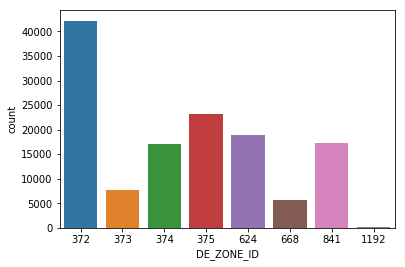

In [64]:
# countplot for de zone id
sns.countplot(df_master.DE_ZONE_ID)
plt.show()

__Deriving New Metrics__

In [65]:
# deriving new variables
varTimeList = ['ASSIGNMENT_START_TIME','ASSIGNMENT_END_TIME','PLACED_TIME','DELIVERED_TIME','LAST_PING_TIME_LAST10MIN'];

def changeToDateTimeIndex(columnName):
    df_master[columnName+'_DAY'] = pd.DatetimeIndex(df_master[columnName]).day
    df_master[columnName+'_MONTH'] = pd.DatetimeIndex(df_master[columnName]).month
    df_master[columnName+'_YEAR'] = pd.DatetimeIndex(df_master[columnName]).year
    df_master[columnName+'_HOUR'] = pd.DatetimeIndex(df_master[columnName]).hour
    df_master[columnName+'_MIN'] = pd.DatetimeIndex(df_master[columnName]).minute
    df_master[columnName+'_SEC'] = pd.DatetimeIndex(df_master[columnName]).second

for i in varTimeList:
    changeToDateTimeIndex(i);

In [66]:
# columns
df_master.columns

Index(['ORDER_ID', 'DE_ID', 'ASSIGNMENT_START_TIME', 'ASSIGNMENT_END_TIME',
       'reject_ind', 'reject_type', 'PLACED_TIME', 'DELIVERED_TIME',
       'LASTMILE_DISTANCE', 'FIRSTMILE_DISTANCE', 'LAST_MILE_TIME_PREDICTED',
       'PAYOUT_MADE_TO_DE', 'NUM_PING_COUNT_LAST10MIN',
       'LAST_PING_TIME_LAST10MIN', 'CUSTOMER_ZONE', 'CUSTOMER_LAT',
       'CUSTOMER_LNG', 'SHIFT_END_TIME', 'DE_HOME_LAT', 'DE_HOME_LNG',
       'DE_JOINING_DATE', 'DE_ZONE_ID', 'ASSIGNMENT_START_TIME_DAY',
       'ASSIGNMENT_START_TIME_MONTH', 'ASSIGNMENT_START_TIME_YEAR',
       'ASSIGNMENT_START_TIME_HOUR', 'ASSIGNMENT_START_TIME_MIN',
       'ASSIGNMENT_START_TIME_SEC', 'ASSIGNMENT_END_TIME_DAY',
       'ASSIGNMENT_END_TIME_MONTH', 'ASSIGNMENT_END_TIME_YEAR',
       'ASSIGNMENT_END_TIME_HOUR', 'ASSIGNMENT_END_TIME_MIN',
       'ASSIGNMENT_END_TIME_SEC', 'PLACED_TIME_DAY', 'PLACED_TIME_MONTH',
       'PLACED_TIME_YEAR', 'PLACED_TIME_HOUR', 'PLACED_TIME_MIN',
       'PLACED_TIME_SEC', 'DELIVERED_TIME_DAY', 'D

In [67]:
# dropping old variables
df_master = df_master.drop(varTimeList, 1)
df_master.columns

Index(['ORDER_ID', 'DE_ID', 'reject_ind', 'reject_type', 'LASTMILE_DISTANCE',
       'FIRSTMILE_DISTANCE', 'LAST_MILE_TIME_PREDICTED', 'PAYOUT_MADE_TO_DE',
       'NUM_PING_COUNT_LAST10MIN', 'CUSTOMER_ZONE', 'CUSTOMER_LAT',
       'CUSTOMER_LNG', 'SHIFT_END_TIME', 'DE_HOME_LAT', 'DE_HOME_LNG',
       'DE_JOINING_DATE', 'DE_ZONE_ID', 'ASSIGNMENT_START_TIME_DAY',
       'ASSIGNMENT_START_TIME_MONTH', 'ASSIGNMENT_START_TIME_YEAR',
       'ASSIGNMENT_START_TIME_HOUR', 'ASSIGNMENT_START_TIME_MIN',
       'ASSIGNMENT_START_TIME_SEC', 'ASSIGNMENT_END_TIME_DAY',
       'ASSIGNMENT_END_TIME_MONTH', 'ASSIGNMENT_END_TIME_YEAR',
       'ASSIGNMENT_END_TIME_HOUR', 'ASSIGNMENT_END_TIME_MIN',
       'ASSIGNMENT_END_TIME_SEC', 'PLACED_TIME_DAY', 'PLACED_TIME_MONTH',
       'PLACED_TIME_YEAR', 'PLACED_TIME_HOUR', 'PLACED_TIME_MIN',
       'PLACED_TIME_SEC', 'DELIVERED_TIME_DAY', 'DELIVERED_TIME_MONTH',
       'DELIVERED_TIME_YEAR', 'DELIVERED_TIME_HOUR', 'DELIVERED_TIME_MIN',
       'DELIVERED_TIME_SEC

In [68]:
# deriving new variables
df_master['SHIFT_END_TIME_HOUR'] = pd.DatetimeIndex(df_master['SHIFT_END_TIME']).hour
df_master['SHIFT_END_TIME_MIN'] = pd.DatetimeIndex(df_master['SHIFT_END_TIME']).minute
df_master['DE_JOINING_DATE_DAY'] = pd.DatetimeIndex(df_master['DE_JOINING_DATE']).day
df_master['DE_JOINING_DATE_MONTH'] = pd.DatetimeIndex(df_master['DE_JOINING_DATE']).month
df_master['DE_JOINING_DATE_YEAR'] = pd.DatetimeIndex(df_master['DE_JOINING_DATE']).year

df_master = df_master.drop(['SHIFT_END_TIME','DE_JOINING_DATE'], 1)

In [69]:
# column dtype
df_master.dtypes


ORDER_ID                             int64
DE_ID                                int64
reject_ind                           int64
reject_type                       category
LASTMILE_DISTANCE                  float64
FIRSTMILE_DISTANCE                 float64
LAST_MILE_TIME_PREDICTED           float64
PAYOUT_MADE_TO_DE                  float64
NUM_PING_COUNT_LAST10MIN             int64
CUSTOMER_ZONE                     category
CUSTOMER_LAT                       float64
CUSTOMER_LNG                       float64
DE_HOME_LAT                        float64
DE_HOME_LNG                        float64
DE_ZONE_ID                        category
ASSIGNMENT_START_TIME_DAY            int64
ASSIGNMENT_START_TIME_MONTH          int64
ASSIGNMENT_START_TIME_YEAR           int64
ASSIGNMENT_START_TIME_HOUR           int64
ASSIGNMENT_START_TIME_MIN            int64
ASSIGNMENT_START_TIME_SEC            int64
ASSIGNMENT_END_TIME_DAY              int64
ASSIGNMENT_END_TIME_MONTH            int64
ASSIGNMENT_

__EDA__

__Bivariate Analysis__

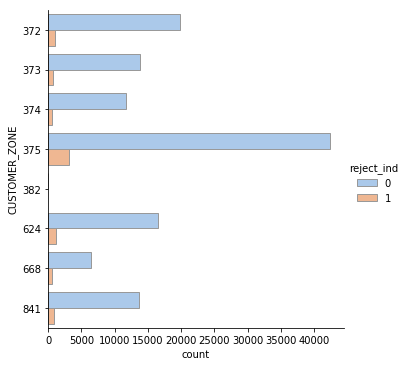

In [70]:
#catplot for customer zone with reject_ind
sns.catplot(y="CUSTOMER_ZONE", hue="reject_ind", kind="count",
            palette="pastel", edgecolor=".6",
            data=df_master)
plt.show()

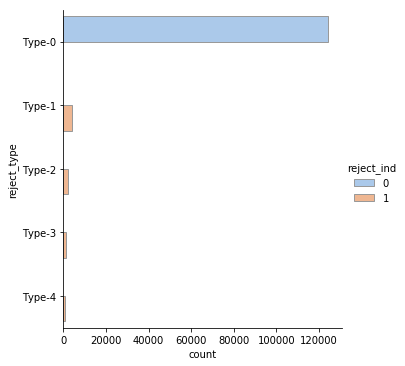

In [71]:
#catplot for reject type with reject_ind
sns.catplot(y="reject_type", hue="reject_ind", kind="count",
            palette="pastel", edgecolor=".6",
            data=df_master)
plt.show()

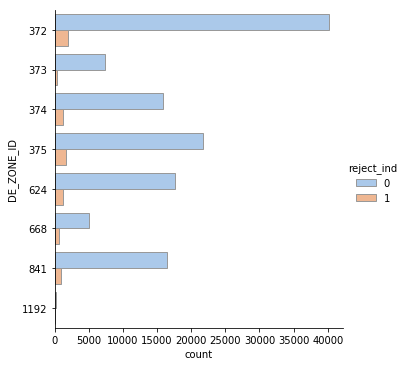

In [72]:
#catplot for de zone id with reject_ind
sns.catplot(y="DE_ZONE_ID", hue="reject_ind", kind="count",
            palette="pastel", edgecolor=".6",
            data=df_master)
plt.show()

__Note__: As per the plot, reject ind 0 has more counts for all customer zone than the reject ind 1 in all catplots

In [73]:
# df_master_numeric
df_master_numeric = df_master.drop(['ORDER_ID','DE_ID','DE_ZONE_ID','CUSTOMER_ZONE','reject_type'], 1)


In [74]:
# pair plot for df_master_numeric
sns.pairplot(df_master_numeric)
plt.show()

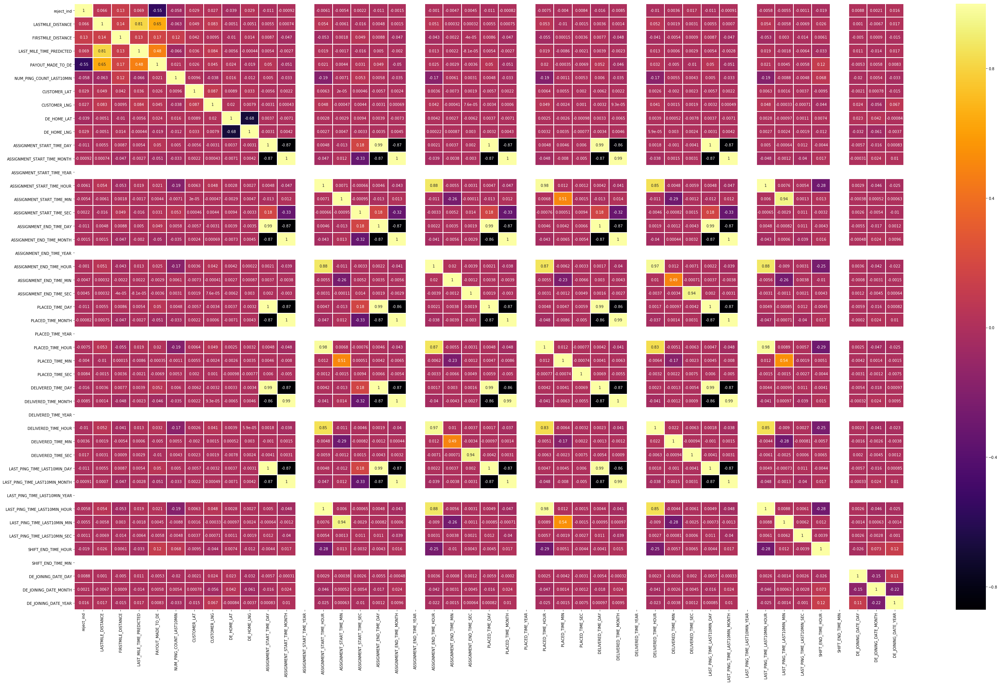

In [75]:
# getting a correlation for numeric variables
plt.figure(figsize = (50,30))
sns.heatmap(df_master_numeric.corr(), annot = True, cmap = "inferno", linewidth = 1)
plt.show()

__Note__ : Multicollinearity is found in the correlation matrix for numeric variables.
           1. Numeric Variables - Derived variables which are formed from date objects have high correlation.
           2. High correlation observed between last ping last 10 min with assignment start time mins and 
           last ping last 10 min with placed time.
           3.High correlation observed between delivery time and assignment time.
           4.There is a positive relation observed between payout made to de and last mile distance.


__Dummy variables creation for categorical variables__

In [76]:
#creating dummies for reject type
reject_dummy_type = pd.get_dummies(df_master['reject_type'], drop_first = True).rename(columns = lambda x:'reject-' + str(x))
reject_dummy_type.head(10)

reject_type,reject-Type-1,reject-Type-2,reject-Type-3,reject-Type-4
0,0,0,0,0
1,0,0,0,0
2,0,0,0,0
3,0,0,0,0
4,0,0,0,0
5,0,0,0,0
6,0,0,0,0
7,0,0,0,0
8,0,0,0,0
9,0,0,0,0


In [77]:
#creating dummies for customer zone
cust_zone_df = pd.get_dummies(df_master['CUSTOMER_ZONE'], drop_first = True).rename(columns = lambda x:'CUSTOMER_ZONE_' + str(x))
cust_zone_df.head(10)

CUSTOMER_ZONE,CUSTOMER_ZONE_373,CUSTOMER_ZONE_374,CUSTOMER_ZONE_375,CUSTOMER_ZONE_382,CUSTOMER_ZONE_624,CUSTOMER_ZONE_668,CUSTOMER_ZONE_841
0,1,0,0,0,0,0,0
1,1,0,0,0,0,0,0
2,1,0,0,0,0,0,0
3,1,0,0,0,0,0,0
4,1,0,0,0,0,0,0
5,1,0,0,0,0,0,0
6,1,0,0,0,0,0,0
7,1,0,0,0,0,0,0
8,1,0,0,0,0,0,0
9,1,0,0,0,0,0,0


In [78]:
#creating dummies for de zone id
df_zone_de = pd.get_dummies(df_master['DE_ZONE_ID'], drop_first = True).rename(columns = lambda x:'DE_ZONE_ID_' + str(x))
df_zone_de.head(10)

DE_ZONE_ID,DE_ZONE_ID_373,DE_ZONE_ID_374,DE_ZONE_ID_375,DE_ZONE_ID_624,DE_ZONE_ID_668,DE_ZONE_ID_841,DE_ZONE_ID_1192
0,1,0,0,0,0,0,0
1,1,0,0,0,0,0,0
2,1,0,0,0,0,0,0
3,1,0,0,0,0,0,0
4,1,0,0,0,0,0,0
5,1,0,0,0,0,0,0
6,1,0,0,0,0,0,0
7,1,0,0,0,0,0,0
8,1,0,0,0,0,0,0
9,1,0,0,0,0,0,0


In [79]:
# dropping old vars
df_master = df_master.drop(['reject_type','CUSTOMER_ZONE','DE_ZONE_ID'], 1)
df_master = pd.concat([df_master,reject_dummy_type, cust_zone_df, df_zone_de], axis = 1)
df_master.head(3)


,ORDER_ID,DE_ID,reject_ind,LASTMILE_DISTANCE,FIRSTMILE_DISTANCE,LAST_MILE_TIME_PREDICTED,PAYOUT_MADE_TO_DE,NUM_PING_COUNT_LAST10MIN,CUSTOMER_LAT,CUSTOMER_LNG,...,CUSTOMER_ZONE_624,CUSTOMER_ZONE_668,CUSTOMER_ZONE_841,DE_ZONE_ID_373,DE_ZONE_ID_374,DE_ZONE_ID_375,DE_ZONE_ID_624,DE_ZONE_ID_668,DE_ZONE_ID_841,DE_ZONE_ID_1192
0,2745,180976,0,320.9,320.0,314.0,1810.0,63,37.377569,72.832560,...,0,0,0,1,0,0,0,0,0,0
1,14974,180976,0,370.4,414.5,378.2,3710.0,52,37.368782,72.809458,...,0,0,0,1,0,0,0,0,0,0
2,115325,180976,0,408.2,320.0,397.2,2760.0,9,37.374205,72.827956,...,0,0,0,1,0,0,0,0,0,0


In [80]:
df_master.columns

Index(['ORDER_ID', 'DE_ID', 'reject_ind', 'LASTMILE_DISTANCE',
       'FIRSTMILE_DISTANCE', 'LAST_MILE_TIME_PREDICTED', 'PAYOUT_MADE_TO_DE',
       'NUM_PING_COUNT_LAST10MIN', 'CUSTOMER_LAT', 'CUSTOMER_LNG',
       'DE_HOME_LAT', 'DE_HOME_LNG', 'ASSIGNMENT_START_TIME_DAY',
       'ASSIGNMENT_START_TIME_MONTH', 'ASSIGNMENT_START_TIME_YEAR',
       'ASSIGNMENT_START_TIME_HOUR', 'ASSIGNMENT_START_TIME_MIN',
       'ASSIGNMENT_START_TIME_SEC', 'ASSIGNMENT_END_TIME_DAY',
       'ASSIGNMENT_END_TIME_MONTH', 'ASSIGNMENT_END_TIME_YEAR',
       'ASSIGNMENT_END_TIME_HOUR', 'ASSIGNMENT_END_TIME_MIN',
       'ASSIGNMENT_END_TIME_SEC', 'PLACED_TIME_DAY', 'PLACED_TIME_MONTH',
       'PLACED_TIME_YEAR', 'PLACED_TIME_HOUR', 'PLACED_TIME_MIN',
       'PLACED_TIME_SEC', 'DELIVERED_TIME_DAY', 'DELIVERED_TIME_MONTH',
       'DELIVERED_TIME_YEAR', 'DELIVERED_TIME_HOUR', 'DELIVERED_TIME_MIN',
       'DELIVERED_TIME_SEC', 'LAST_PING_TIME_LAST10MIN_DAY',
       'LAST_PING_TIME_LAST10MIN_MONTH', 'LAST_PING_TIM

__Sanity Checks__

In [81]:
# sanity check for no payout made to de for rejection
df_master[(df_master.reject_ind == 1) & (df_master.PAYOUT_MADE_TO_DE > 0)].shape

(0, 65)

In [82]:
#df_master
df_master.head()


,ORDER_ID,DE_ID,reject_ind,LASTMILE_DISTANCE,FIRSTMILE_DISTANCE,LAST_MILE_TIME_PREDICTED,PAYOUT_MADE_TO_DE,NUM_PING_COUNT_LAST10MIN,CUSTOMER_LAT,CUSTOMER_LNG,...,CUSTOMER_ZONE_624,CUSTOMER_ZONE_668,CUSTOMER_ZONE_841,DE_ZONE_ID_373,DE_ZONE_ID_374,DE_ZONE_ID_375,DE_ZONE_ID_624,DE_ZONE_ID_668,DE_ZONE_ID_841,DE_ZONE_ID_1192
0,2745,180976,0,320.9,320.0,314.0,1810.0,63,37.377569,72.832560,...,0,0,0,1,0,0,0,0,0,0
1,14974,180976,0,370.4,414.5,378.2,3710.0,52,37.368782,72.809458,...,0,0,0,1,0,0,0,0,0,0
2,115325,180976,0,408.2,320.0,397.2,2760.0,9,37.374205,72.827956,...,0,0,0,1,0,0,0,0,0,0
3,1648,180976,0,389.6,342.8,382.5,2210.0,16,37.369154,72.815318,...,0,0,0,1,0,0,0,0,0,0
4,72496,180976,0,392.3,418.1,351.3,2460.0,13,37.376896,72.834044,...,0,0,0,1,0,0,0,0,0,0


In [83]:
# sanity check for delivery partners are allowed 1 reject per day
df_master['start_date'] =  df_master['ASSIGNMENT_START_TIME_DAY'].astype('str') + "-" + df_master['ASSIGNMENT_START_TIME_MONTH'].astype('str') + "-" + df_master['ASSIGNMENT_START_TIME_YEAR'].astype('str') 
df_reject_order = df_master[df_master.reject_ind == 1]


In [84]:
# reject order for getting same days with DE_ID
df_reject_order = df_reject_order.pivot_table(values= ['reject_ind'], index='start_date', columns= 'DE_ID',aggfunc='count')
df_reject_order['reject_ind'] = df_reject_order['reject_ind'].fillna(0)


In [85]:
# deriving new variable for penalty check if delivery partner has more rejects per day
df_master['penalty_check'] = 0
d = df_reject_order.to_dict("index")
for k, v in d.items():
     v = {key: value for key, value in v.items() if value > 1}
     d[k] = v
     t = v.keys()
     d[k] = list(zip(*t))[1]

def function_with_penalty_check(row):
    if((row.reject_ind == 1) & (row['start_date'] in d.keys()) & (row['DE_ID'] in list(d.get(row['start_date'])))):
        row.penalty_check = 1
    return row
    
    
df_master = df_master.apply(lambda row : function_with_penalty_check(row), axis = 1)

In [86]:
# shape of records for penalty check 1
df_master[df_master['penalty_check'] == 1].shape

(5941, 67)

In [87]:
# remove irrelevant columns
df_master = df_master.drop(['ORDER_ID','DE_ID','start_date'], 1)


In [88]:
# shape of df_master
df_master.shape

(132391, 64)

__Splitting the data set into Test and Train sets__

In [89]:
# X
X = df_master.drop(['reject_ind'], axis = 1)
X.head()

,LASTMILE_DISTANCE,FIRSTMILE_DISTANCE,LAST_MILE_TIME_PREDICTED,PAYOUT_MADE_TO_DE,NUM_PING_COUNT_LAST10MIN,CUSTOMER_LAT,CUSTOMER_LNG,DE_HOME_LAT,DE_HOME_LNG,ASSIGNMENT_START_TIME_DAY,...,CUSTOMER_ZONE_668,CUSTOMER_ZONE_841,DE_ZONE_ID_373,DE_ZONE_ID_374,DE_ZONE_ID_375,DE_ZONE_ID_624,DE_ZONE_ID_668,DE_ZONE_ID_841,DE_ZONE_ID_1192,penalty_check
0,320.9,320.0,314.0,1810.0,63,37.377569,72.832560,37.374634,72.871986,13,...,0,0,1,0,0,0,0,0,0,0
1,370.4,414.5,378.2,3710.0,52,37.368782,72.809458,37.374634,72.871986,15,...,0,0,1,0,0,0,0,0,0,0
2,408.2,320.0,397.2,2760.0,9,37.374205,72.827956,37.374634,72.871986,4,...,0,0,1,0,0,0,0,0,0,0
3,389.6,342.8,382.5,2210.0,16,37.369154,72.815318,37.374634,72.871986,13,...,0,0,1,0,0,0,0,0,0,0
4,392.3,418.1,351.3,2460.0,13,37.376896,72.834044,37.374634,72.871986,25,...,0,0,1,0,0,0,0,0,0,0


In [90]:
# y
y = df_master['reject_ind']
y.head()

0    0
1    0
2    0
3    0
4    0
Name: reject_ind, dtype: int64

In [91]:
# train and test split
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7, test_size = 0.3, random_state=333 )

In [92]:
# numeric variables
numericVars = ['LASTMILE_DISTANCE','FIRSTMILE_DISTANCE', 'LAST_MILE_TIME_PREDICTED', 'PAYOUT_MADE_TO_DE','NUM_PING_COUNT_LAST10MIN', 'CUSTOMER_LAT', 'CUSTOMER_LNG',
'DE_HOME_LAT', 'DE_HOME_LNG', 'ASSIGNMENT_START_TIME_DAY','ASSIGNMENT_START_TIME_MONTH', 'ASSIGNMENT_START_TIME_YEAR','ASSIGNMENT_START_TIME_HOUR', 'ASSIGNMENT_START_TIME_MIN',
'ASSIGNMENT_START_TIME_SEC', 'ASSIGNMENT_END_TIME_DAY','ASSIGNMENT_END_TIME_MONTH', 'ASSIGNMENT_END_TIME_YEAR','ASSIGNMENT_END_TIME_HOUR', 'ASSIGNMENT_END_TIME_MIN',
'ASSIGNMENT_END_TIME_SEC', 'PLACED_TIME_DAY', 'PLACED_TIME_MONTH','PLACED_TIME_YEAR', 'PLACED_TIME_HOUR', 'PLACED_TIME_MIN',
'PLACED_TIME_SEC', 'DELIVERED_TIME_DAY', 'DELIVERED_TIME_MONTH','DELIVERED_TIME_YEAR', 'DELIVERED_TIME_HOUR', 'DELIVERED_TIME_MIN',
'DELIVERED_TIME_SEC', 'LAST_PING_TIME_LAST10MIN_DAY','LAST_PING_TIME_LAST10MIN_MONTH', 'LAST_PING_TIME_LAST10MIN_YEAR','LAST_PING_TIME_LAST10MIN_HOUR', 'LAST_PING_TIME_LAST10MIN_MIN',
'LAST_PING_TIME_LAST10MIN_SEC', 'SHIFT_END_TIME_HOUR','SHIFT_END_TIME_MIN', 'DE_JOINING_DATE_DAY', 'DE_JOINING_DATE_MONTH','DE_JOINING_DATE_YEAR']

__Feature Scaling__

In [93]:
# using standard scaler
scaler = StandardScaler()
X_train[numericVars] = scaler.fit_transform(X_train[numericVars])
X_train.head()

,LASTMILE_DISTANCE,FIRSTMILE_DISTANCE,LAST_MILE_TIME_PREDICTED,PAYOUT_MADE_TO_DE,NUM_PING_COUNT_LAST10MIN,CUSTOMER_LAT,CUSTOMER_LNG,DE_HOME_LAT,DE_HOME_LNG,ASSIGNMENT_START_TIME_DAY,...,CUSTOMER_ZONE_668,CUSTOMER_ZONE_841,DE_ZONE_ID_373,DE_ZONE_ID_374,DE_ZONE_ID_375,DE_ZONE_ID_624,DE_ZONE_ID_668,DE_ZONE_ID_841,DE_ZONE_ID_1192,penalty_check
38062,0.987484,0.885277,1.281271,1.566658,-1.140814,-0.973259,-1.939698,0.071841,-0.045207,-0.402790,...,0,0,0,0,0,0,0,0,0,0
8970,-0.900673,0.518929,-1.076272,-0.436495,-0.801693,1.294350,-1.341471,0.138152,-0.085156,-1.821245,...,0,0,0,0,1,0,0,0,0,0
97449,-0.959335,0.832942,-1.146813,-2.172560,-0.971253,-0.165260,-0.195920,-0.007393,-0.041342,0.424643,...,0,0,0,0,0,0,0,0,0,1
125757,0.103900,2.455342,0.618560,0.349055,0.159150,1.437498,-0.547902,0.135935,-0.070585,-0.166380,...,0,0,0,0,1,0,0,0,0,0
97672,-1.050993,-1.118424,-1.265618,-0.789992,-0.914733,0.569229,1.011351,0.154273,-0.081010,0.306438,...,0,0,0,0,0,0,1,0,0,0


In [94]:
# rate of rejection
reject_rate = (sum(df_master['reject_ind'])/len(df_master['reject_ind'].index)) * 100
reject_rate

6.078963071507882

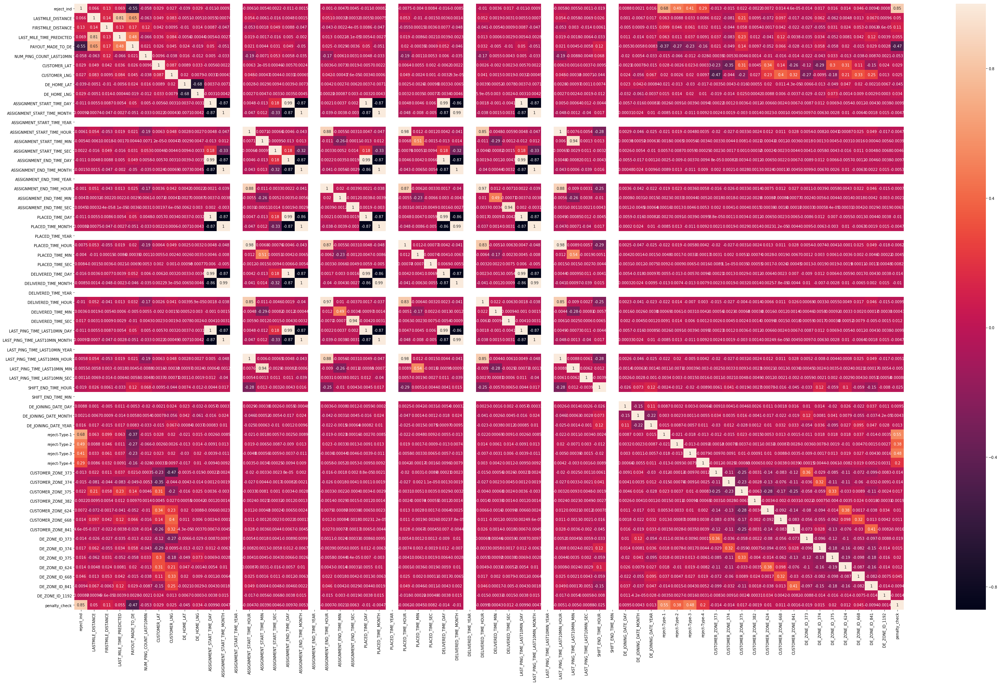

In [95]:
# correlation
plt.figure(figsize = (50,30))
sns.heatmap(df_master.corr(), annot = True)
plt.show()

__Note__ : Multicollinearity is found. Feature Selection is mandatory for modelling.
           1. High correlation between penalty check and reject ind
           2. Zones with other numeric columns have weak bond.
           3. Derived metrics formed from date and timings are strongly related.
           4. Reject types seems to have correlated with reject ind.

__Model Building__

In [97]:
# Logistic Regression model
lm = LogisticRegression()
lm.fit(X_train, y_train)
y_train_pred = lm.predict(X_train)
print(metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lm.predict(X_test)
print(metrics.r2_score(y_true=y_test, y_pred=y_test_pred))

1.0
1.0


__Model Evaluation for Logistic Classification__

In [98]:
#checking mean squared error
metrics.mean_squared_error(y_test, y_test_pred)

0.0

In [99]:
# confusion metrics
confusion = metrics.confusion_matrix(y_test,  y_test_pred)
print(confusion)
print(classification_report(y_test, y_test_pred))

[[37274     0]
 [    0  2444]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     37274
           1       1.00      1.00      1.00      2444

    accuracy                           1.00     39718
   macro avg       1.00      1.00      1.00     39718
weighted avg       1.00      1.00      1.00     39718



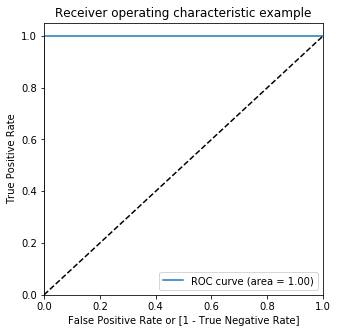

In [100]:
# draw roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_test_pred)
auc_score = metrics.roc_auc_score(y_test, y_test_pred)
plt.figure(figsize=(5, 5))
plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()



In [101]:
#cofficient params for all the columns
model_parameters = list(lm.coef_)
final_model_parameters = model_parameters[0]
np.insert(final_model_parameters, 0, lm.intercept_)
final_model_parameters = [round(x, 3) for x in final_model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")
sorted(list(zip(final_model_parameters,cols)), key=lambda x:abs(x[0]), reverse=True)

[(-7.829, 'LAST_MILE_TIME_PREDICTED'),
 (1.953, 'DE_ZONE_ID_1192'),
 (1.887, 'DE_JOINING_DATE_YEAR'),
 (1.796, 'reject-Type-1'),
 (1.172, 'LASTMILE_DISTANCE'),
 (1.124, 'reject-Type-3'),
 (0.935, 'constant'),
 (0.764, 'reject-Type-2'),
 (0.301, 'FIRSTMILE_DISTANCE'),
 (-0.196, 'PAYOUT_MADE_TO_DE'),
 (-0.182, 'DELIVERED_TIME_DAY'),
 (0.137, 'DE_ZONE_ID_373'),
 (0.097, 'LAST_PING_TIME_LAST10MIN_YEAR'),
 (0.089, 'DE_ZONE_ID_624'),
 (-0.085, 'DE_ZONE_ID_668'),
 (0.071, 'CUSTOMER_ZONE_374'),
 (-0.063, 'DE_ZONE_ID_375'),
 (0.053, 'ASSIGNMENT_END_TIME_YEAR'),
 (0.051, 'CUSTOMER_LAT'),
 (-0.048, 'ASSIGNMENT_START_TIME_YEAR'),
 (0.044, 'reject-Type-4'),
 (-0.043, 'PLACED_TIME_SEC'),
 (-0.042, 'DE_ZONE_ID_374'),
 (0.041, 'LAST_PING_TIME_LAST10MIN_SEC'),
 (0.039, 'ASSIGNMENT_START_TIME_MIN'),
 (-0.039, 'ASSIGNMENT_END_TIME_HOUR'),
 (-0.039, 'PLACED_TIME_YEAR'),
 (0.034, 'CUSTOMER_ZONE_624'),
 (-0.034, 'CUSTOMER_ZONE_668'),
 (0.027, 'ASSIGNMENT_START_TIME_HOUR'),
 (0.026, 'DE_HOME_LAT'),
 (-0.025,

__Note__ : Highly imbalanced classification is found in dataset. Lets try out ridge and lasso.

__Ridge Regression__

In [102]:
#Ridge
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}


ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [103]:
#plotting model_cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results = cv_results[cv_results['param_alpha']<=200]
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.224606,0.178796,0.007204,0.006362,0.0001,{'alpha': 0.0001},-3.834489e-08,-3.381814e-08,-3.402396e-08,-3.417045e-08,...,-3.479557e-08,1.784389e-09,1,-3.375152e-08,-3.389580e-08,-3.378698e-08,-3.385353e-08,-3.386783e-08,-3.383113e-08,5.351408e-11
1,0.107358,0.010676,0.010274,0.008548,0.001,{'alpha': 0.001},-3.460175e-07,-3.369260e-07,-3.390101e-07,-3.403085e-07,...,-3.393870e-07,3.827076e-09,2,-3.361258e-07,-3.376643e-07,-3.365534e-07,-3.372192e-07,-3.371994e-07,-3.369524e-07,5.443166e-10
2,0.109678,0.000654,0.013622,0.008035,0.01,{'alpha': 0.01},-3.312593e-06,-3.308871e-06,-3.329004e-06,-3.340450e-06,...,-3.314625e-06,1.980923e-08,3,-3.303703e-06,-3.316979e-06,-3.305997e-06,-3.311474e-06,-3.305804e-06,-3.308791e-06,4.834314e-09
3,0.116464,0.013830,0.007856,0.006990,0.05,{'alpha': 0.05},-1.636154e-05,-1.636799e-05,-1.647178e-05,-1.652952e-05,...,-1.639162e-05,1.038339e-07,4,-1.635489e-05,-1.641350e-05,-1.636253e-05,-1.638259e-05,-1.634749e-05,-1.637220e-05,2.373840e-08
4,0.106371,0.011521,0.009361,0.007644,0.1,{'alpha': 0.1},-3.267240e-05,-3.268279e-05,-3.289535e-05,-3.300718e-05,...,-3.273138e-05,2.093480e-07,5,-3.266009e-05,-3.277807e-05,-3.267660e-05,-3.271525e-05,-3.264560e-05,-3.269512e-05,4.755695e-08


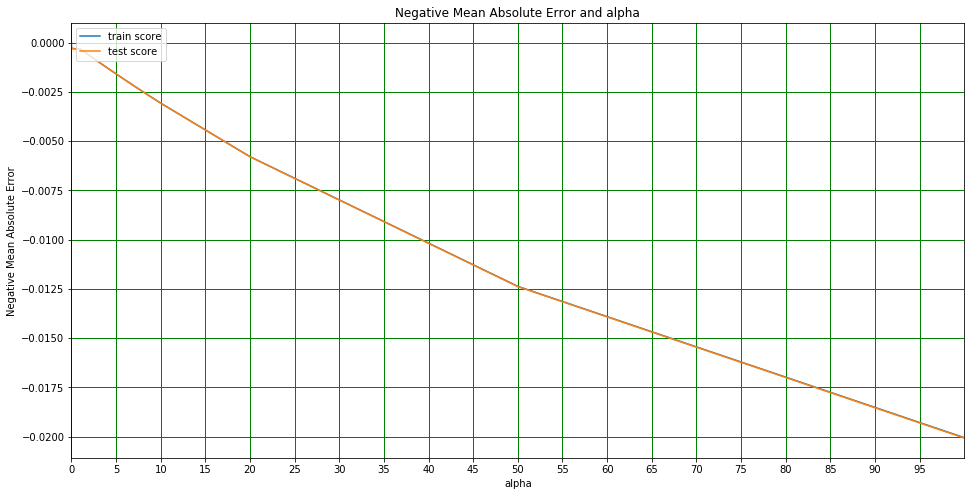

In [104]:
#plotting mean test and train scores with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

plt.figure(figsize=(16,8))
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.xlim(0, 100)
plt.xticks(np.arange(0, 100, 5))
plt.grid(color='g', linestyle='-', linewidth=1)
plt.show()

In [105]:
#getting ridge model best lambda
model_cv.best_estimator_

Ridge(alpha=0.0001)

__Model Evaluation for Ridge Regression__

In [106]:
#r2 score results
alpha = 0.0001
ridge = Ridge(alpha=alpha)
ridge.fit(X_train, y_train)
y_train_pred = ridge.predict(X_train)
print("Prediction on Train data :")
print(metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred_ridge = ridge.predict(X_test)
print("Prediction on Test data :")
print(metrics.r2_score(y_true=y_test, y_pred=y_test_pred_ridge))

Prediction on Train data :
0.9999999999999615
Prediction on Test data :
0.9999995675786236


In [107]:
#checking mean squared error
metrics.mean_squared_error(y_test, y_test_pred_ridge)

2.4971211569610695e-08

In [108]:
# ridge coeff dict
ridge_coeff_dict = dict(pd.Series(ridge.coef_.round(6), index = X_train.columns))
ridge_coeff_dict

{'LASTMILE_DISTANCE': 0.0,
 'FIRSTMILE_DISTANCE': 0.0,
 'LAST_MILE_TIME_PREDICTED': -0.0,
 'PAYOUT_MADE_TO_DE': -0.0,
 'NUM_PING_COUNT_LAST10MIN': -0.0,
 'CUSTOMER_LAT': 0.0,
 'CUSTOMER_LNG': 0.0,
 'DE_HOME_LAT': 0.0,
 'DE_HOME_LNG': 0.0,
 'ASSIGNMENT_START_TIME_DAY': 1.7e-05,
 'ASSIGNMENT_START_TIME_MONTH': 2.4e-05,
 'ASSIGNMENT_START_TIME_YEAR': 0.0,
 'ASSIGNMENT_START_TIME_HOUR': 1e-06,
 'ASSIGNMENT_START_TIME_MIN': 0.0,
 'ASSIGNMENT_START_TIME_SEC': 0.0,
 'ASSIGNMENT_END_TIME_DAY': -1e-05,
 'ASSIGNMENT_END_TIME_MONTH': -1.3e-05,
 'ASSIGNMENT_END_TIME_YEAR': 0.0,
 'ASSIGNMENT_END_TIME_HOUR': -0.0,
 'ASSIGNMENT_END_TIME_MIN': -0.0,
 'ASSIGNMENT_END_TIME_SEC': -0.0,
 'PLACED_TIME_DAY': 1e-06,
 'PLACED_TIME_MONTH': 2e-06,
 'PLACED_TIME_YEAR': 0.0,
 'PLACED_TIME_HOUR': 0.0,
 'PLACED_TIME_MIN': 0.0,
 'PLACED_TIME_SEC': -0.0,
 'DELIVERED_TIME_DAY': -0.0,
 'DELIVERED_TIME_MONTH': -0.0,
 'DELIVERED_TIME_YEAR': 0.0,
 'DELIVERED_TIME_HOUR': -0.0,
 'DELIVERED_TIME_MIN': 0.0,
 'DELIVERED_TIME_S

In [111]:
# Put the Features and coefficienst in a dataframe
ridge_df = pd.DataFrame({'Features':X_train.columns, 'Coefficient':ridge.coef_.round(7)})
ridge_df.reset_index(drop=True, inplace=True)
ridge_df

,Features,Coefficient
0,LASTMILE_DISTANCE,0.000000e+00
1,FIRSTMILE_DISTANCE,0.000000e+00
2,LAST_MILE_TIME_PREDICTED,-0.000000e+00
3,PAYOUT_MADE_TO_DE,-1.000000e-07
4,NUM_PING_COUNT_LAST10MIN,-0.000000e+00
...,...,...
58,DE_ZONE_ID_624,0.000000e+00
59,DE_ZONE_ID_668,0.000000e+00
60,DE_ZONE_ID_841,0.000000e+00
61,DE_ZONE_ID_1192,0.000000e+00


__Feature Selection__

In [112]:
# Do an RFE to minimise the features to 15
X_train_ridge = X_train[ridge_df.Features]

lm = LogisticRegression()
lm.fit(X_train_ridge, y_train)

# running RFE
rfe = RFE(lm, 15)            
rfe = rfe.fit(X_train_ridge, y_train)

In [113]:
# Method to get the coefficient values

def find(x):
    return ridge_coeff_dict[x]

# Assign top 10 features to a temp dataframe for further display in the bar plot

temp1_df = pd.DataFrame(list(zip( X_train_ridge.columns, rfe.support_, rfe.ranking_)), columns=['Features', 'rfe_support', 'rfe_ranking'])
temp1_df = temp1_df.loc[temp1_df['rfe_support'] == True]
temp1_df.reset_index(drop=True, inplace=True)

temp1_df['Coefficient'] = temp1_df['Features'].apply(find)
temp1_df = temp1_df.sort_values(by=['Coefficient'], ascending=False)
temp1_df = temp1_df.head(15)
temp1_df

,Features,rfe_support,rfe_ranking,Coefficient
7,reject-Type-1,True,1,1.000000
8,reject-Type-2,True,1,1.000000
9,reject-Type-3,True,1,0.999999
10,reject-Type-4,True,1,0.999999
0,LASTMILE_DISTANCE,True,1,0.000000
1,FIRSTMILE_DISTANCE,True,1,0.000000
2,LAST_MILE_TIME_PREDICTED,True,1,-0.000000
3,PAYOUT_MADE_TO_DE,True,1,-0.000000
4,NUM_PING_COUNT_LAST10MIN,True,1,-0.000000
5,DELIVERED_TIME_DAY,True,1,-0.000000


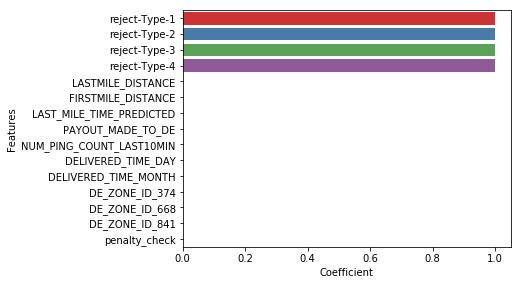

In [114]:
# bar plot to determine the variables that would affect rejection using ridge regression

plt.figure(figsize=(20,20))
plt.subplot(4,3,1)
sns.barplot(y = 'Features', x='Coefficient', palette='Set1', data = temp1_df)
plt.show()

__Lasso Regression__

In [115]:
# lasso
lasso = Lasso()

# list of alphas

params = {'alpha': [0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.001, 0.002, 0.003, 0.004, 0.005, 0.01]}

# cross validation

folds = 5
lasso_model_cv = GridSearchCV(estimator = lasso,                         
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

lasso_model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 11 candidates, totalling 55 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.0002, 0.0003, 0.0004, 0.0005,
                                   0.001, 0.002, 0.003, 0.004, 0.005, 0.01]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [116]:
# lasso cv results
lasso_cv_results = pd.DataFrame(lasso_model_cv.cv_results_)
lasso_cv_results[['param_alpha', 'mean_train_score', 'mean_test_score', 'rank_test_score']].sort_values(by = ['rank_test_score'])

,param_alpha,mean_train_score,mean_test_score,rank_test_score
0,0.0001,-0.002004,-0.002005,1
1,0.0002,-0.003967,-0.003968,2
2,0.0003,-0.005929,-0.005931,3
3,0.0004,-0.007893,-0.007896,4
4,0.0005,-0.009854,-0.009857,5
5,0.001,-0.019670,-0.019676,6
6,0.002,-0.039275,-0.039287,7
7,0.003,-0.051051,-0.051065,8
8,0.004,-0.055627,-0.055644,9
9,0.005,-0.060542,-0.060559,10


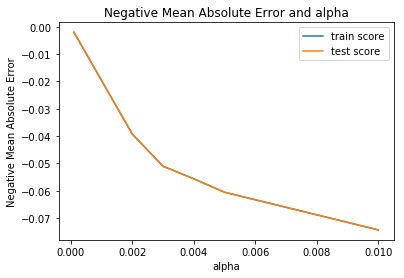

In [117]:
# plotting mean test and train scoes with alpha 

lasso_cv_results['param_alpha'] = lasso_cv_results['param_alpha'].astype('float64')

# plotting

plt.plot(lasso_cv_results['param_alpha'], lasso_cv_results['mean_train_score'])
plt.plot(lasso_cv_results['param_alpha'], lasso_cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')

plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()


In [118]:
# get the best estimator for lambda

lasso_model_cv.best_estimator_

Lasso(alpha=0.0001)

__Model Evaluation for Lasso Regression__

In [119]:

# check the coefficient values with lambda = 0.0001

alpha = 0.0001

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train, y_train) 
lasso.coef_

array([ 3.01948226e-03,  8.25655593e-04, -0.00000000e+00, -4.50482342e-03,
       -0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
        0.00000000e+00,  0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -0.00000000e+00,  2.22287489e-05,  0.00000000e+00,
       -0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
       -9.35799325e-05,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -0.00000000e+00, -0.00000000e+00,  2.79126396e-04,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        9.71053185e-01,  9.69179243e-01,  9.59506795e-01,  9.59363022e-01,
       -0.00000000e+00, -0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  

In [120]:
# mean squared error
metrics.mean_squared_error(y_test,lasso.predict(X_test))

149.13000790664407

In [126]:

print("Prediction on Train data :")
print(metrics.r2_score(y_true=y_train, y_pred=lasso.predict(X_train)))
print("Prediction on Test data :")
print(metrics.r2_score(y_true=y_test, y_pred=lasso.predict(X_test)))

Prediction on Train data :
0.9997982564554204
Prediction on Test data :
-2581.4539227113078


In [121]:
# features and coefficents for lasso
lasso_df = pd.DataFrame({'Features':X_train.columns, 'Coefficient':lasso.coef_.round(4)})
lasso_df = lasso_df[lasso_df['Coefficient'] != 0.00]
lasso_df.reset_index(drop=True, inplace=True)
lasso_df

,Features,Coefficient
0,LASTMILE_DISTANCE,0.0030
1,FIRSTMILE_DISTANCE,0.0008
2,PAYOUT_MADE_TO_DE,-0.0045
3,DELIVERED_TIME_MONTH,-0.0001
4,SHIFT_END_TIME_HOUR,0.0003
5,reject-Type-1,0.9711
6,reject-Type-2,0.9692
7,reject-Type-3,0.9595
8,reject-Type-4,0.9594
9,penalty_check,0.0188


In [122]:
# Put the Features and Coefficients in dictionary
lasso_coeff_dict = dict(pd.Series(lasso.coef_, index = X_train.columns))
lasso_coeff_dict

{'LASTMILE_DISTANCE': 0.003019482260973926,
 'FIRSTMILE_DISTANCE': 0.0008256555931104305,
 'LAST_MILE_TIME_PREDICTED': -0.0,
 'PAYOUT_MADE_TO_DE': -0.004504823417837577,
 'NUM_PING_COUNT_LAST10MIN': -0.0,
 'CUSTOMER_LAT': 0.0,
 'CUSTOMER_LNG': 0.0,
 'DE_HOME_LAT': -0.0,
 'DE_HOME_LNG': 0.0,
 'ASSIGNMENT_START_TIME_DAY': 0.0,
 'ASSIGNMENT_START_TIME_MONTH': -0.0,
 'ASSIGNMENT_START_TIME_YEAR': 0.0,
 'ASSIGNMENT_START_TIME_HOUR': 0.0,
 'ASSIGNMENT_START_TIME_MIN': -0.0,
 'ASSIGNMENT_START_TIME_SEC': 2.222874892917215e-05,
 'ASSIGNMENT_END_TIME_DAY': 0.0,
 'ASSIGNMENT_END_TIME_MONTH': -0.0,
 'ASSIGNMENT_END_TIME_YEAR': 0.0,
 'ASSIGNMENT_END_TIME_HOUR': 0.0,
 'ASSIGNMENT_END_TIME_MIN': -0.0,
 'ASSIGNMENT_END_TIME_SEC': -0.0,
 'PLACED_TIME_DAY': 0.0,
 'PLACED_TIME_MONTH': -0.0,
 'PLACED_TIME_YEAR': 0.0,
 'PLACED_TIME_HOUR': 0.0,
 'PLACED_TIME_MIN': -0.0,
 'PLACED_TIME_SEC': -0.0,
 'DELIVERED_TIME_DAY': 0.0,
 'DELIVERED_TIME_MONTH': -9.357993250956634e-05,
 'DELIVERED_TIME_YEAR': 0.0,
 'DELI

__Feature Selection__

In [123]:
# rfe for lasso
X_train_lasso = X_train[lasso_df.Features]

lm = LogisticRegression()
lm.fit(X_train_lasso, y_train)

# running RFE

rfe = RFE(lm, 15)            
rfe = rfe.fit(X_train_lasso, y_train)

In [124]:
# Method to get the coefficient values

def find(x):
    return lasso_coeff_dict[x]

# Assign top 10 features to a temp dataframe for further display in the bar plot

temp2_df = pd.DataFrame(list(zip( X_train_lasso.columns, rfe.support_, rfe.ranking_)), columns=['Features', 'rfe_support', 'rfe_ranking'])
temp2_df = temp2_df.loc[temp2_df['rfe_support'] == True]
temp2_df.reset_index(drop=True, inplace=True)

temp2_df['Coefficient'] = temp2_df['Features'].apply(find)
temp2_df = temp2_df.sort_values(by=['Coefficient'], ascending=False)
temp2_df = temp2_df.head(10)
temp2_df

,Features,rfe_support,rfe_ranking,Coefficient
5,reject-Type-1,True,1,0.971053
6,reject-Type-2,True,1,0.969179
7,reject-Type-3,True,1,0.959507
8,reject-Type-4,True,1,0.959363
9,penalty_check,True,1,0.018813
0,LASTMILE_DISTANCE,True,1,0.003019
1,FIRSTMILE_DISTANCE,True,1,0.000826
4,SHIFT_END_TIME_HOUR,True,1,0.000279
3,DELIVERED_TIME_MONTH,True,1,-0.000094
2,PAYOUT_MADE_TO_DE,True,1,-0.004505


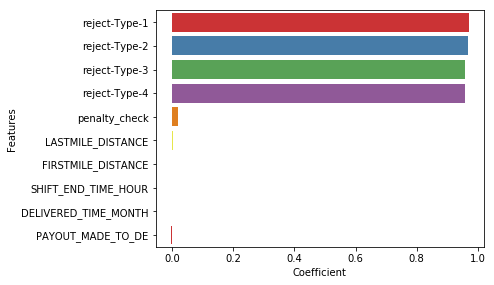

In [125]:
# plotting barplot for checking rejection
plt.figure(figsize=(20,20))
plt.subplot(4,3,1)
sns.barplot(y = 'Features', x='Coefficient', palette='Set1', data = temp2_df)
plt.show()

__Note__ : Both Ridge and Lasso Regression has same alpha parameter value. So, Features which are emphasizing as per the bar plot are
           as follows: Rejection type, payout made to de, delivered time, penalty-check